2025-12-09
- I have already changed the name Brain to Astro in chip experiment and set the figures to Arial, 300 dpi.
- In 2025-12-07 version, I removed all Endo 12h and Astro 12h, because rep 3 in either case was outlier (considering the values and PCA). Here, instead I only remove the outlier samples, so we'll have 2 samples for Endo KD 12h and Astro KD 12h.

In [13]:
#Heatmap, chip model 2025-12-09
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set global font size and family and resolution
plt.rc('font', size=16, family='Arial') 
plt.rcParams['figure.dpi'] = 300

# Reload the data from the uploaded file
file_path = 'chip_20251209_removing_only_2outliers.csv'
datac = pd.read_csv(file_path)

# Set the 'Unnamed: 0' column as the index
datac.set_index('Unnamed: 0', inplace=True)
datac.index.name = None

# Log transformation
log_datac = np.log1p(datac)

# Calculate the square root of the standard deviation for Pareto scaling
sqrt_std = np.sqrt(log_datac.std())

# Apply Pareto scaling by dividing each variable by the square root of its standard deviation
pareto_scaled_datac = log_datac / sqrt_std

# Convert the scaled data back into a DataFrame
pareto_scaled_dfc = pd.DataFrame(pareto_scaled_datac, index=log_datac.index, columns=log_datac.columns)

# Create the clustermap with the correctly processed data
g = sns.clustermap(pareto_scaled_dfc, cmap="viridis", metric="euclidean", method="average", figsize=(20, 30))

# Adjust the color bar position to the upper half of the right-hand side
g.cax.set_position([1, 0.3, 0.03, 0.25])  # [left, bottom, width, height]
g.fig.suptitle("Hierarchical Clustering of Metabolites in Chip Model", fontsize=40, fontweight='bold', y=1.02)

# Set y-axis (row) label font
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14, fontweight='bold')

# Set x-axis (column) label font
def new_func(g):
    g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=14, fontweight='bold', rotation=90)

# Display the plot
    plt.show()

#new_func(g)

In [12]:
#Heatmap for transwell 2025-12-09
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set global font size and family
plt.rc('font', size=16, family='Arial') 
plt.rcParams['figure.dpi'] = 300

# Reload the data from the uploaded file
file_path = 'transwell.csv'
datac = pd.read_csv(file_path)

# Set the 'Unnamed: 0' column as the index
datac.set_index('Unnamed: 0', inplace=True)
datac.index.name = None

# Log transformation
log_datac = np.log1p(datac)

# Calculate the square root of the standard deviation for Pareto scaling
sqrt_std = np.sqrt(log_datac.std())

# Apply Pareto scaling by dividing each variable by the square root of its standard deviation
pareto_scaled_datac = log_datac / sqrt_std

# Convert the scaled data back into a DataFrame
pareto_scaled_dfc = pd.DataFrame(pareto_scaled_datac, index=log_datac.index, columns=log_datac.columns)

# Create the clustermap with the correctly processed data
g = sns.clustermap(pareto_scaled_dfc, cmap="viridis", metric="euclidean", method="average", figsize=(20, 30))

# Adjust the color bar position to the upper half of the right-hand side
g.cax.set_position([1, 0.3, 0.03, 0.25])  # [left, bottom, width, height]

#title
g.fig.suptitle("Hierarchical Clustering of Metabolites in Transwell Model", fontsize=40, fontweight='bold', y=1.02)

# Set y-axis (row) label font
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=14, fontweight='bold')

# Set x-axis (column) label font
g.ax_heatmap.set_xticklabels(g.ax_heatmap.get_xticklabels(), fontsize=16, fontweight='bold', rotation=90)

# Display the plot
plt.show()

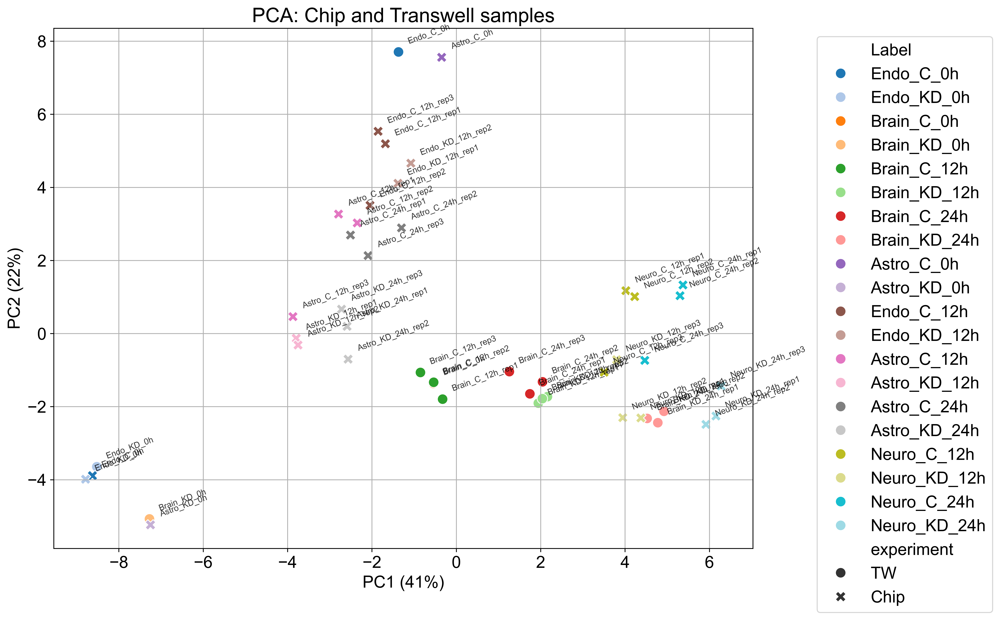

In [8]:
#PCA of all datapoints with annotations, 2025-12-09
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# Set global font size, family, and DPI
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 600

# Load data
df = pd.read_csv('chip_TW_PCA_20251209_removing_only_2outliers.csv')

# Use Sample column and first data column for annotations
sample_ids = df['Sample']
annotations = df.iloc[:, 0]  # Now correctly using column 1 (right after 'Sample')

# Only numeric features
features_df = df.select_dtypes(include=[np.number]).dropna()

# Align metadata
valid_idx = features_df.index
labels = df.loc[valid_idx, 'Label']
shapes = df.loc[valid_idx, 'experiment']
annotations = annotations.loc[valid_idx]
sample_ids = sample_ids.loc[valid_idx]

# PCA
log_feat = np.log1p(features_df)
pareto_scaled_feat = log_feat / np.sqrt(log_feat.std())
pca = PCA(n_components=2)
principal_components = pca.fit_transform(pareto_scaled_feat)

# Results DataFrame
pca_df = pd.DataFrame(principal_components, columns=['PC1', 'PC2'])
pca_df['Label'] = labels.values
pca_df['experiment'] = shapes.values
pca_df['Annotation'] = annotations.values
pca_df['Sample'] = sample_ids.values

# Plot
plt.figure(figsize=(12, 9))
scatter = sns.scatterplot(x='PC1', y='PC2', hue='Label', style='experiment', data=pca_df, s=100, palette='tab20')

#adjusting the annotations
for i in range(len(pca_df)):
    plt.annotate(str(pca_df.loc[i, 'Annotation']),
                 (pca_df.loc[i, 'PC1'], pca_df.loc[i, 'PC2']),
                 textcoords="offset points",
                 xytext=(8, 8),  # (x_offset, y_offset) in points
                 ha='left', fontsize=8, alpha=0.8, rotation=20)


plt.legend(title=None)
scatter.legend_.set_bbox_to_anchor((1.08, 1))
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]*100:.0f}%)')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]*100:.0f}%)')
plt.title('PCA: Chip and Transwell samples')
plt.grid(True)
plt.show()

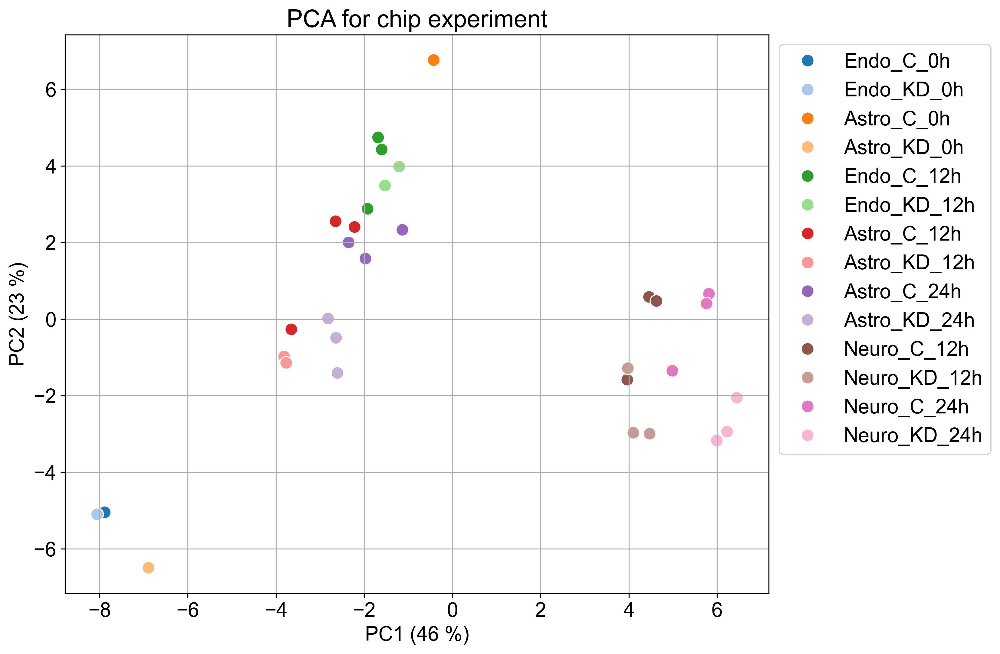

In [5]:
#2025-12-09 PCA for chip
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Set font size and family and image resolution
plt.rc('font', size= 16, family= 'Arial')
plt.rcParams['figure.dpi'] = 300

# Load and prepare data
df = pd.read_csv('chip_PCA_label2_20251209_removing_only_2outliers.csv')
df.set_index('Sample', inplace=True)
labels = df['Label']
features_df = df.drop (columns='Label')

# Apply Pareto scaling by dividing each variable by the square root of its standard deviation
log_feat = np.log1p(features_df) # Log transformation 
sqrt_std = np.sqrt(log_feat.std()) #Calculate the square root of the standard deviation for Pareto scaling
pareto_scaled_feat = log_feat / sqrt_std

pca = PCA(n_components= 2)
principal_components = pca.fit_transform(pareto_scaled_feat)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index= features_df.index)

# Calculate the explained variance ratio for each PC
explained_variance_ratio = pca.explained_variance_ratio_

# add labels for color coding
pca_df['Label'] = labels

plt.figure(figsize=(10,8))
scatter = sns.scatterplot(x='PC1', y='PC2', hue='Label', data= pca_df, s=100, palette='tab20')
plt.legend(title=None)
legend = scatter.legend_
legend.set_bbox_to_anchor((1.33, 1))
plt.title('PCA for chip experiment')
plt.xlabel (f'PC1 ({explained_variance_ratio[0]*100:.0f} %)')
plt.ylabel (f'PC2 ({(explained_variance_ratio[1]*100):.0f} %)')
plt.grid(True)
# Save the figure with high resolution (300 DPI)
#plt.savefig('pca_plot_high_res.png', dpi=300, bbox_inches='tight')
plt.show()

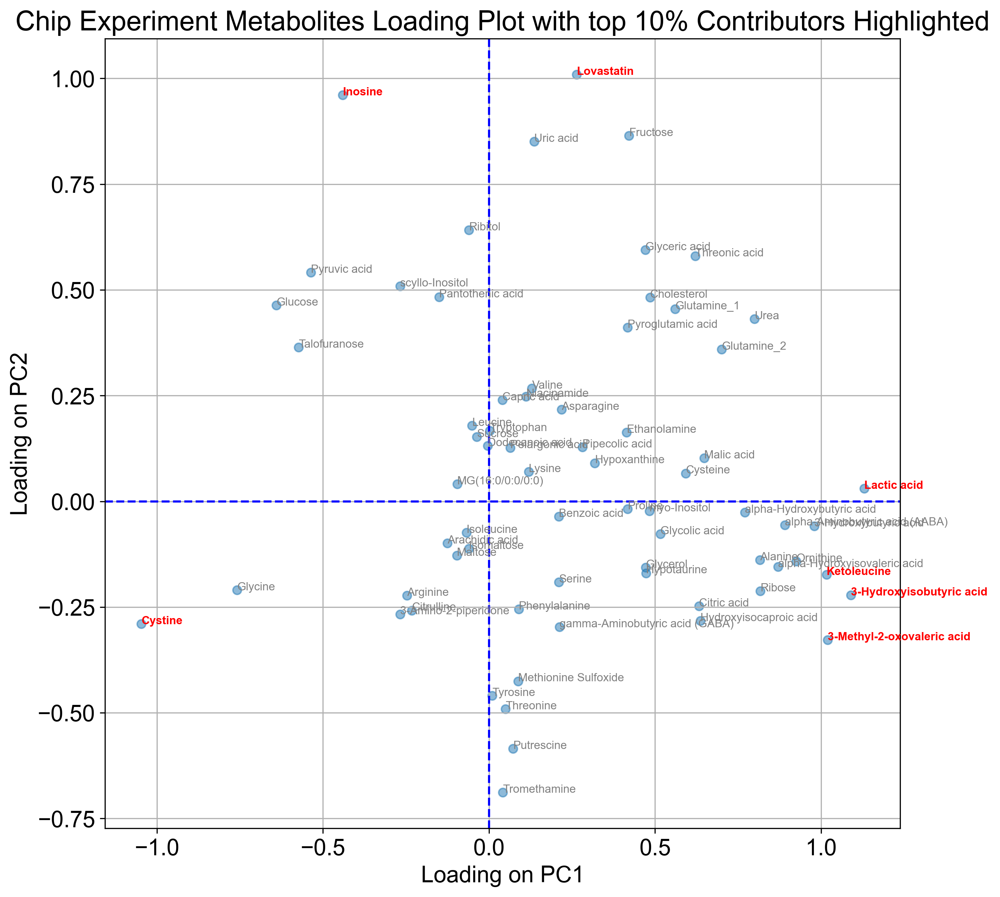

In [ ]:
#Loading plot for Chip 2025-12-09
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Load data (rows = metabolites, columns = samples)
df = pd.read_csv('chip_20251209_removing_only_2outliers.csv', index_col=0)

# Transpose so samples are rows, metabolites are features
df_t = df.T

# Log-transform and Pareto scale
log_df = np.log1p(df_t)
pareto_scaled = log_df.div(np.sqrt(log_df.std()), axis=1)

# PCA
pca = PCA(n_components=2)
scores = pca.fit_transform(pareto_scaled)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create loading plot (metabolite contributions to PCs)
loading_df = pd.DataFrame(loadings, index=pareto_scaled.columns, columns=['PC1', 'PC2'])

# Calculate loading magnitudes and define top 10% as significant
loading_df['magnitude'] = np.sqrt(loading_df['PC1']**2 + loading_df['PC2']**2)
cutoff = loading_df['magnitude'].quantile(0.90)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(loading_df['PC1'], loading_df['PC2'], alpha=0.5)

for metabolite, row in loading_df.iterrows():
    color = 'red' if row['magnitude'] >= cutoff else 'gray'
    weight = 'bold' if row['magnitude'] >= cutoff else 'normal'
    plt.text(row['PC1'], row['PC2'], metabolite, fontsize=8, color=color, fontweight=weight)

plt.axhline(0, color='blue', linestyle='--')
plt.axvline(0, color='blue', linestyle='--')
plt.title('Chip Experiment Metabolites Loading Plot with top 10% Contributors Highlighted')
plt.xlabel('Loading on PC1')
plt.ylabel('Loading on PC2')
plt.grid(True)
plt.show()

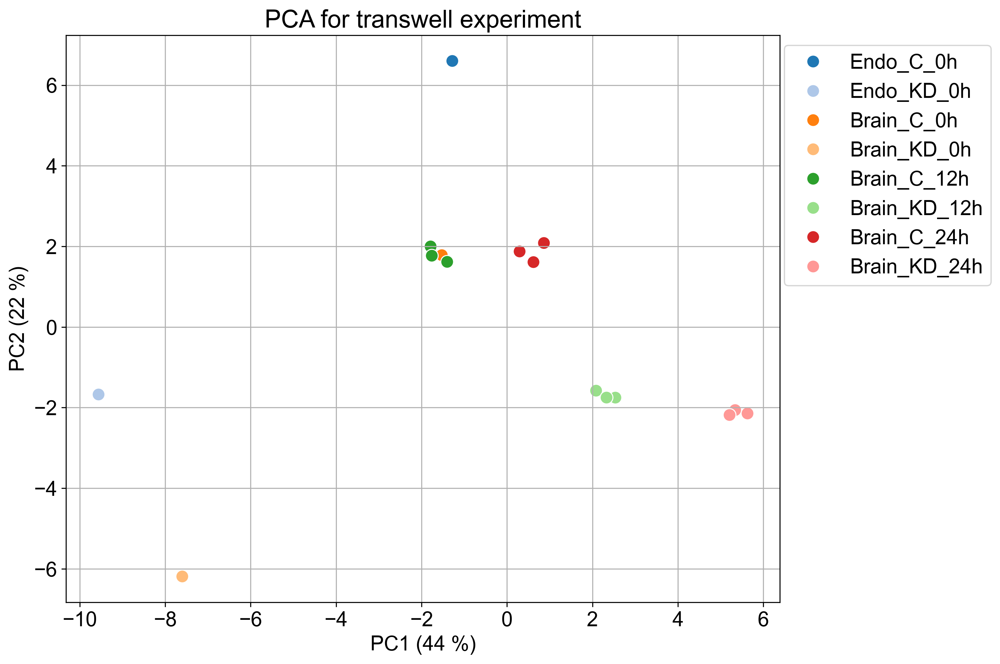

In [7]:
#2025-12-09 PCA for transwell 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Set font size and family and image resolution
plt.rc('font', size= 16, family= 'Arial')
plt.rcParams['figure.dpi'] = 300

# Load and prepare data
df = pd.read_csv('transwell_PCA_label2.csv')
df.set_index('Sample', inplace=True)
labels = df['Label']
features_df = df.drop (columns='Label')

# Apply Pareto scaling by dividing each variable by the square root of its standard deviation
log_feat = np.log1p(features_df) # Log transformation 
sqrt_std = np.sqrt(log_feat.std()) #Calculate the square root of the standard deviation for Pareto scaling
pareto_scaled_feat = log_feat / sqrt_std

pca = PCA(n_components= 2)
principal_components = pca.fit_transform(pareto_scaled_feat)
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'], index= features_df.index)

# Calculate the explained variance ratio for each PC
explained_variance_ratio = pca.explained_variance_ratio_

# add labels for color coding
pca_df['Label'] = labels

plt.figure(figsize=(10,8))
scatter = sns.scatterplot(x='PC1', y='PC2', hue='Label', data= pca_df, s=100, palette='tab20')
plt.legend(title=None)
legend = scatter.legend_
legend.set_bbox_to_anchor((1.31, 1))
plt.title('PCA for transwell experiment')
plt.xlabel (f'PC1 ({explained_variance_ratio[0]*100:.0f} %)')
plt.ylabel (f'PC2 ({(explained_variance_ratio[1]*100):.0f} %)')
plt.grid(True)
# Save the figure with high resolution (300 DPI)
#plt.savefig('pca_plot_high_res.png', dpi=300, bbox_inches='tight')
plt.show()

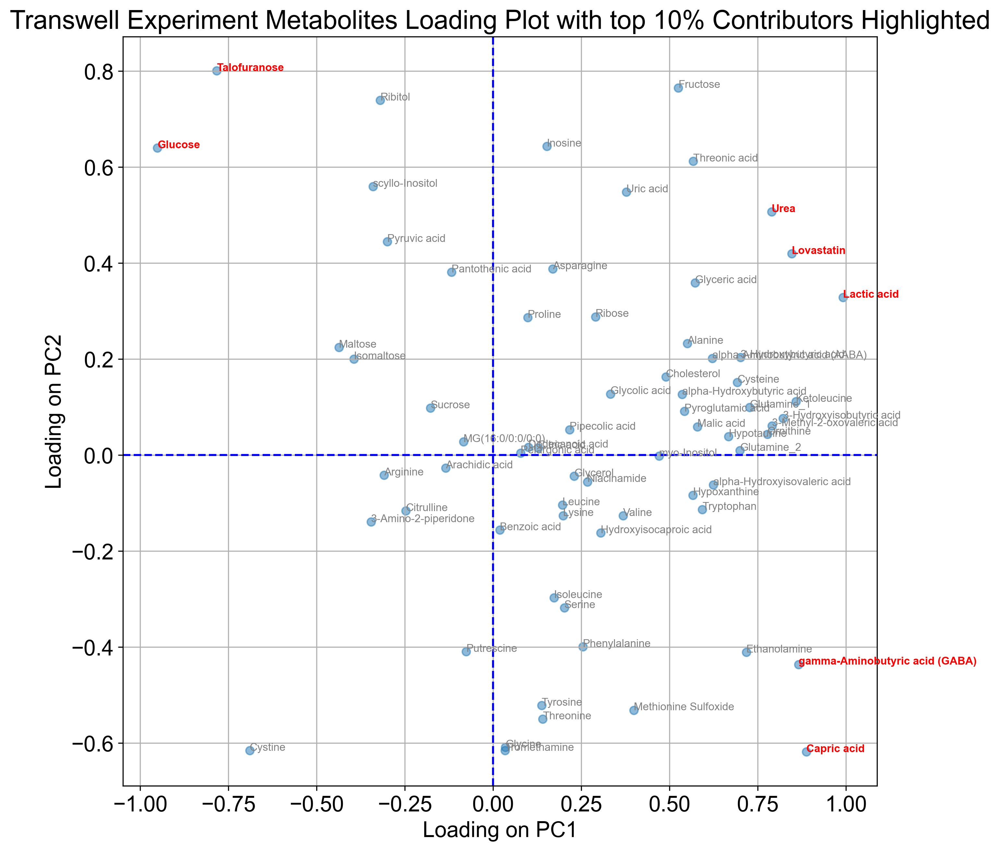

In [8]:
#Loading plot for transwell experiemnt 2025-12-09
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

# Set global font size and family
plt.rc('font', size=16, family='Arial') 
plt.rcParams['figure.dpi'] = 300

# Load data (rows = metabolites, columns = samples)
df = pd.read_csv('transwell.csv', index_col=0)

# Transpose so samples are rows, metabolites are features
df_t = df.T

# Log-transform and Pareto scale
log_df = np.log1p(df_t)
pareto_scaled = log_df.div(np.sqrt(log_df.std()), axis=1)

# PCA
pca = PCA(n_components=2)
scores = pca.fit_transform(pareto_scaled)
loadings = pca.components_.T * np.sqrt(pca.explained_variance_)

# Create loading plot (metabolite contributions to PCs)
loading_df = pd.DataFrame(loadings, index=pareto_scaled.columns, columns=['PC1', 'PC2'])

# Calculate loading magnitudes and define top 10% as significant
loading_df['magnitude'] = np.sqrt(loading_df['PC1']**2 + loading_df['PC2']**2)
cutoff = loading_df['magnitude'].quantile(0.90)

# Plot
plt.figure(figsize=(10, 10))
plt.scatter(loading_df['PC1'], loading_df['PC2'], alpha=0.5)

for metabolite, row in loading_df.iterrows():
    color = 'red' if row['magnitude'] >= cutoff else 'gray'
    weight = 'bold' if row['magnitude'] >= cutoff else 'normal'
    plt.text(row['PC1'], row['PC2'], metabolite, fontsize=8, color=color, fontweight=weight)

plt.axhline(0, color='blue', linestyle='--')
plt.axvline(0, color='blue', linestyle='--')
plt.title('Transwell Experiment Metabolites Loading Plot with top 10% Contributors Highlighted')
plt.xlabel('Loading on PC1')
plt.ylabel('Loading on PC2')
plt.grid(True)
plt.show()

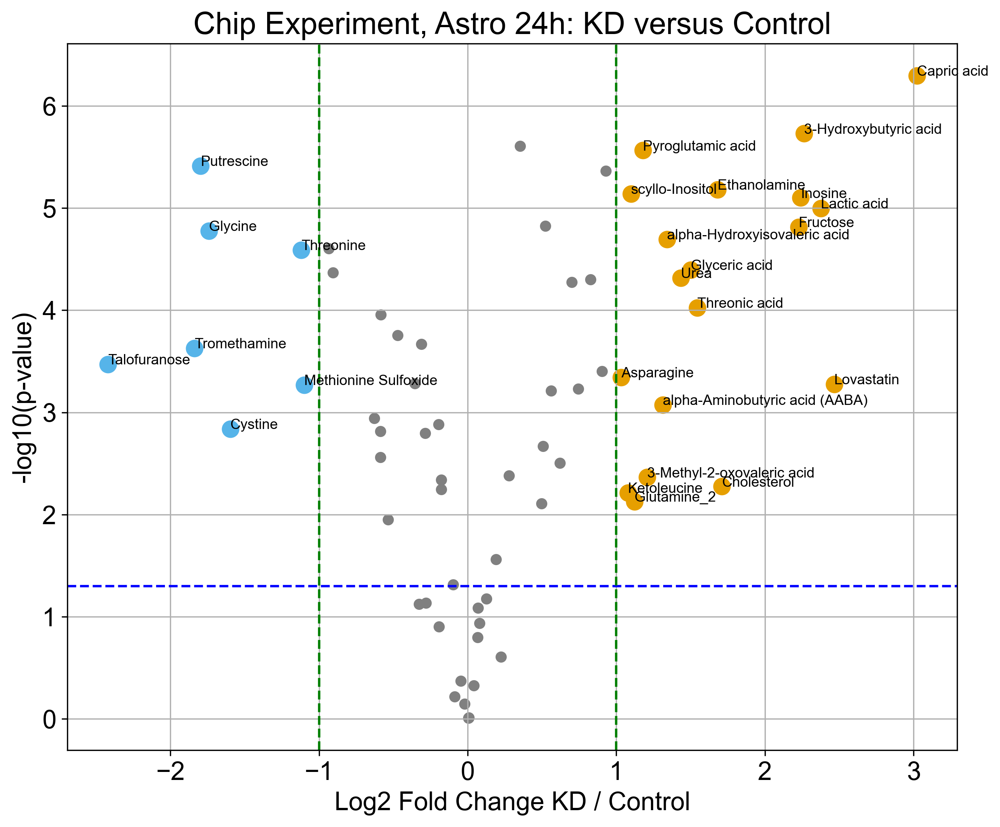

Significant up in KD:
                                                    Metabolite    log2FC  \
Lactic acid                                        Lactic acid  2.375442   
alpha-Aminobutyric acid (AABA)  alpha-Aminobutyric acid (AABA)  1.313548   
3-Hydroxybutyric acid                    3-Hydroxybutyric acid  2.263727   
alpha-Hydroxyisovaleric acid      alpha-Hydroxyisovaleric acid  1.342007   
3-Methyl-2-oxovaleric acid          3-Methyl-2-oxovaleric acid  1.208017   
Ketoleucine                                        Ketoleucine  1.077772   
Urea                                                      Urea  1.434185   
Ethanolamine                                      Ethanolamine  1.680908   
Lovastatin                                          Lovastatin  2.465443   
Glyceric acid                                    Glyceric acid  1.501908   
Capric acid                                        Capric acid  3.021926   
Pyroglutamic acid                            Pyroglutamic acid  1.

In [1]:
#Volcano plot chip Astro 24 h C vs KD; Normalize data to Astro 0h, ctrl to ctrl and KD to KD 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_PCA_label1_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract relevant samples
astro_c_24h = data_numeric.filter(like='Astro_C_24h', axis=0)
astro_kd_24h = data_numeric.filter(like='Astro_KD_24h', axis=0)
astro_c_0h = data_numeric.filter(like='Astro_C_0h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize each 24h group to its 0h baseline
norm_c = astro_c_24h.div(astro_c_0h.mean())
norm_kd = astro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_c = np.log1p(norm_c).div(np.sqrt(np.log1p(norm_c).std()), axis=1)
log_kd = np.log1p(norm_kd).div(np.sqrt(np.log1p(norm_kd).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_kd.mean() / log_c.mean())
p_vals = [ttest_ind(log_c[col], log_kd[col]).pvalue for col in log_c.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_c.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_kd = hits[hits['log2FC'] > 1]
up_in_ctrl = hits[hits['log2FC'] < -1]

plt.scatter(up_in_kd['log2FC'], up_in_kd['-log10(p-value)'], color='#E69F00', s=100, label='Up in KD')  # orange
plt.scatter(up_in_ctrl['log2FC'], up_in_ctrl['-log10(p-value)'], color='#56B4E9', s=100, label='Up in Control')  # blue


# Annotate
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.title('Chip Experiment, Astro 24h: KD versus Control')
plt.xlabel('Log2 Fold Change KD / Control')
plt.ylabel('-log10(p-value)')
plt.grid(True)
plt.show()

# Print and save significant metabolites
print("Significant up in KD:")
print(hits[hits['log2FC'] > 1][['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in Control:")
print(hits[hits['log2FC'] < -1][['Metabolite', 'log2FC', 'p-value']])

#hits.to_csv('sig_hits_chip_AstKDvsCtrl24h_20251209.csv', index=False)

c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


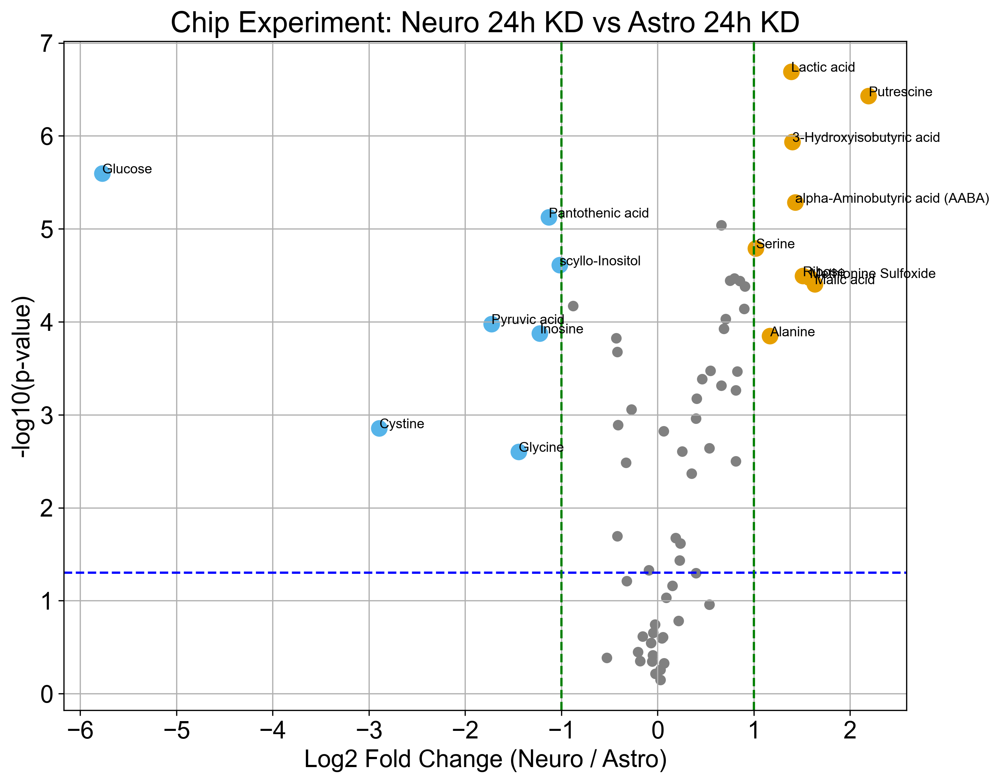

Significant up in Neuro:
                                                    Metabolite    log2FC  \
Lactic acid                                        Lactic acid  1.387362   
Alanine                                                Alanine  1.164382   
alpha-Aminobutyric acid (AABA)  alpha-Aminobutyric acid (AABA)  1.429135   
3-Hydroxyisobutyric acid              3-Hydroxyisobutyric acid  1.401199   
Serine                                                  Serine  1.018109   
Malic acid                                          Malic acid  1.631564   
Ribose                                                  Ribose  1.508300   
Putrescine                                          Putrescine  2.189420   
Methionine Sulfoxide                      Methionine Sulfoxide  1.579351   

                                     p-value  
Lactic acid                     2.033360e-07  
Alanine                         1.424686e-04  
alpha-Aminobutyric acid (AABA)  5.211801e-06  
3-Hydroxyisobutyric acid  

In [19]:
# Volcano Plot: Chip Neuro 24h KD vs Astro 24h KD (Normalized to Astro 0h KD) 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_PCA_label1_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract relevant samples
neuro_kd_24h = data_numeric.filter(like='Neuro_KD_24h', axis=0)
astro_kd_24h = data_numeric.filter(like='Astro_KD_24h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize both groups to Astro KD 0h
norm_neuro = neuro_kd_24h.div(astro_kd_0h.mean())
norm_astro = astro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_neuro = np.log1p(norm_neuro).div(np.sqrt(np.log1p(norm_neuro).std()), axis=1)
log_astro = np.log1p(norm_astro).div(np.sqrt(np.log1p(norm_astro).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_neuro.mean() / log_astro.mean())
p_vals = [ttest_ind(log_astro[col], log_neuro[col]).pvalue for col in log_astro.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_astro.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_neuro = hits[hits['log2FC'] > 1]
up_in_astro = hits[hits['log2FC'] < -1]

plt.scatter(up_in_neuro['log2FC'], up_in_neuro['-log10(p-value)'], color='#E69F00', s=100)  # orange
plt.scatter(up_in_astro['log2FC'], up_in_astro['-log10(p-value)'], color='#56B4E9', s=100)  # blue

# Annotate hits
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

# Titles and axis
plt.title('Chip Experiment: Neuro 24h KD vs Astro 24h KD')
plt.xlabel('Log2 Fold Change (Neuro / Astro)')
plt.ylabel('-log10(p-value)')
plt.grid(True)

# Remove legend
plt.legend([], [], frameon=False)
plt.show()

# Print results
print("Significant up in Neuro:")
print(up_in_neuro[['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in Astro:")
print(up_in_astro[['Metabolite', 'log2FC', 'p-value']])

#hits.to_csv('sig_hits_chip_Neurovs Astro_KD24h_20251209.csv', index=False)

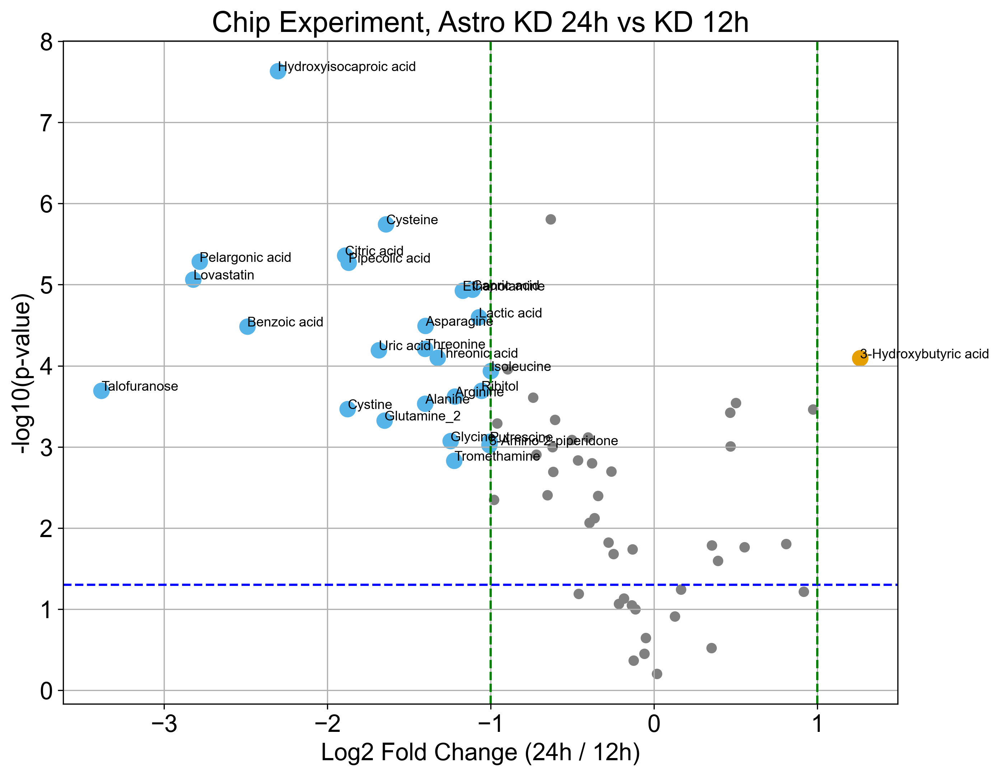

Significant up in 24h KD:
                                  Metabolite    log2FC   p-value
3-Hydroxybutyric acid  3-Hydroxybutyric acid  1.261108  0.000081

Significant up in 12h KD:
                                    Metabolite    log2FC       p-value
Lactic acid                        Lactic acid -1.072245  2.524964e-05
Alanine                                Alanine -1.403561  2.927927e-04
Hydroxyisocaproic acid  Hydroxyisocaproic acid -2.305257  2.319532e-08
Benzoic acid                      Benzoic acid -2.491723  3.265204e-05
Ethanolamine                      Ethanolamine -1.170987  1.185211e-05
Isoleucine                          Isoleucine -1.000196  1.157411e-04
Glycine                                Glycine -1.247355  8.460277e-04
Lovastatin                          Lovastatin -2.822443  8.605007e-06
Pelargonic acid                Pelargonic acid -2.782864  5.196786e-06
Pipecolic acid                  Pipecolic acid -1.870851  5.339809e-06
Threonine                           

In [20]:
# Volcano plot: Astro KD 24h vs Astro KD 12h, normalized to KD 0h, 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_PCA_label1_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract relevant samples
astro_kd_12h = data_numeric.filter(like='Astro_KD_12h', axis=0)
astro_kd_24h = data_numeric.filter(like='Astro_KD_24h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize to Astro KD 0h
norm_12h = astro_kd_12h.div(astro_kd_0h.mean())
norm_24h = astro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_12h = np.log1p(norm_12h).div(np.sqrt(np.log1p(norm_12h).std()), axis=1)
log_24h = np.log1p(norm_24h).div(np.sqrt(np.log1p(norm_24h).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_24h.mean() / log_12h.mean())
p_vals = [ttest_ind(log_12h[col], log_24h[col]).pvalue for col in log_12h.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_12h.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_24h = hits[hits['log2FC'] > 1]
up_in_12h = hits[hits['log2FC'] < -1]

plt.scatter(up_in_24h['log2FC'], up_in_24h['-log10(p-value)'], color='#E69F00', s=100) #, label='Up in 24h KD')  # orange
plt.scatter(up_in_12h['log2FC'], up_in_12h['-log10(p-value)'], color='#56B4E9', s=100) #, label='Up in 12h KD')  # blue

# Annotate
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.title('Chip Experiment, Astro KD 24h vs KD 12h')
plt.xlabel('Log2 Fold Change (24h / 12h)')
plt.ylabel('-log10(p-value)')
#plt.legend()
plt.grid(True)
plt.show()

# Print and optionally save significant metabolites
print("Significant up in 24h KD:")
print(up_in_24h[['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in 12h KD:")
print(up_in_12h[['Metabolite', 'log2FC', 'p-value']])

# Uncomment to save:
# hits.to_csv('sig_hits_chip_AstKD24h_vs_12h_20251209.csv', index=False)


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


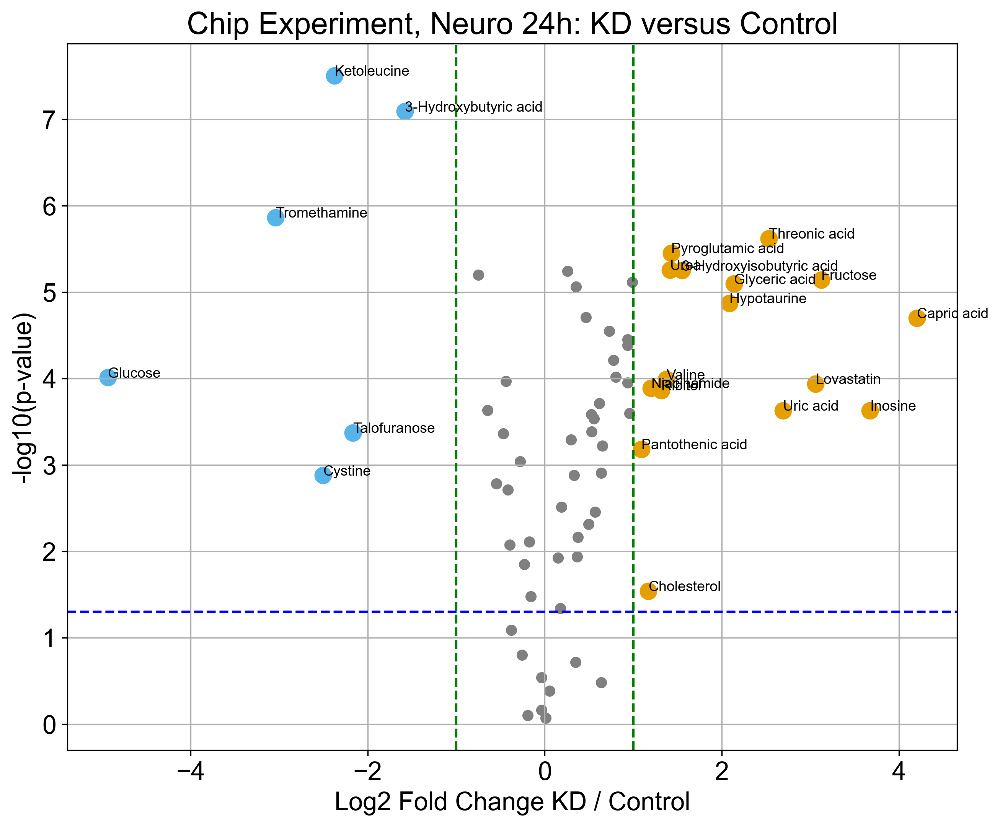

Significant up in KD:
                                        Metabolite    log2FC   p-value
3-Hydroxyisobutyric acid  3-Hydroxyisobutyric acid  1.550016  0.000006
Valine                                      Valine  1.375091  0.000102
Urea                                          Urea  1.415183  0.000006
Lovastatin                              Lovastatin  3.060837  0.000115
Glyceric acid                        Glyceric acid  2.139701  0.000008
Capric acid                            Capric acid  4.203355  0.000020
Niacinamide                            Niacinamide  1.199120  0.000128
Pyroglutamic acid                Pyroglutamic acid  1.429741  0.000004
Threonic acid                        Threonic acid  2.529932  0.000002
Hypotaurine                            Hypotaurine  2.086358  0.000013
Ribitol                                    Ribitol  1.316639  0.000137
Fructose                                  Fructose  3.125004  0.000007
Pantothenic acid                  Pantothenic acid  1.0

In [9]:
#Volcano plot chip Neuro 24 h KD vs C; Normalize data to Astro 0h, ctrl to ctrl and KD to KD 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_PCA_label1_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract relevant samples
astro_c_24h = data_numeric.filter(like='Neuro_C_24h', axis=0)
astro_kd_24h = data_numeric.filter(like='Neuro_KD_24h', axis=0)
astro_c_0h = data_numeric.filter(like='Astro_C_0h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize each 24h group to its 0h baseline
norm_c = astro_c_24h.div(astro_c_0h.mean())
norm_kd = astro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_c = np.log1p(norm_c).div(np.sqrt(np.log1p(norm_c).std()), axis=1)
log_kd = np.log1p(norm_kd).div(np.sqrt(np.log1p(norm_kd).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_kd.mean() / log_c.mean())
p_vals = [ttest_ind(log_c[col], log_kd[col]).pvalue for col in log_c.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_c.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_kd = hits[hits['log2FC'] > 1]
up_in_ctrl = hits[hits['log2FC'] < -1]

plt.scatter(up_in_kd['log2FC'], up_in_kd['-log10(p-value)'], color='#E69F00', s=100, label='Up in KD')  # orange
plt.scatter(up_in_ctrl['log2FC'], up_in_ctrl['-log10(p-value)'], color='#56B4E9', s=100, label='Up in Control')  # blue


# Annotate
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.title('Chip Experiment, Neuro 24h: KD versus Control')
plt.xlabel('Log2 Fold Change KD / Control')
plt.ylabel('-log10(p-value)')
plt.grid(True)
plt.show()

# Print and save significant metabolites
print("Significant up in KD:")
print(hits[hits['log2FC'] > 1][['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in Control:")
print(hits[hits['log2FC'] < -1][['Metabolite', 'log2FC', 'p-value']])

#hits.to_csv('sig_hits_chip_AstKDvsCtrl24h_20251209.csv', index=False)

c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


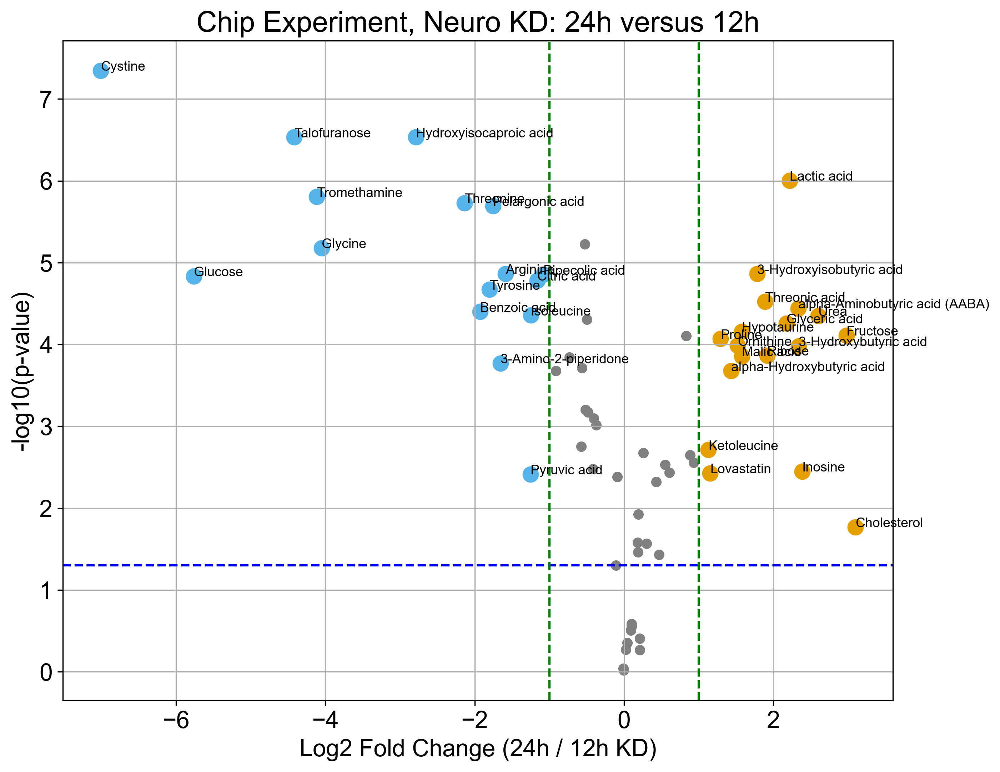

Significant up in 24h KD:
                                                    Metabolite    log2FC  \
Lactic acid                                        Lactic acid  2.218104   
alpha-Hydroxybutyric acid            alpha-Hydroxybutyric acid  1.436714   
alpha-Aminobutyric acid (AABA)  alpha-Aminobutyric acid (AABA)  2.336476   
3-Hydroxybutyric acid                    3-Hydroxybutyric acid  2.337435   
3-Hydroxyisobutyric acid              3-Hydroxyisobutyric acid  1.784916   
Ketoleucine                                        Ketoleucine  1.130848   
Urea                                                      Urea  2.601153   
Proline                                                Proline  1.294011   
Lovastatin                                          Lovastatin  1.152281   
Glyceric acid                                    Glyceric acid  2.174458   
Malic acid                                          Malic acid  1.580865   
Threonic acid                                    Threonic acid

In [ ]:
#Volcano plot chip Neuro 24 h KD vs 12h KD; Normalize data to Astro 0h, ctrl to ctrl and KD to KD 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_PCA_label1_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract relevant samples
neuro_kd_12h = data_numeric.filter(like='Neuro_KD_12h', axis=0) 
neuro_kd_24h = data_numeric.filter(like='Neuro_KD_24h', axis=0) 
astro_c_0h = data_numeric.filter(like='Astro_C_0h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize each 24h group to its 0h baseline
norm_12 = astro_kd_12h.div(astro_c_0h.mean())
norm_24 = astro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_12 = np.log1p(norm_12).div(np.sqrt(np.log1p(norm_12).std()), axis=1)
log_24 = np.log1p(norm_24).div(np.sqrt(np.log1p(norm_24).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_24.mean() / log_12.mean())
p_vals = [ttest_ind(log_12[col], log_24[col]).pvalue for col in log_12.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_12.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_kd = hits[hits['log2FC'] > 1]
up_in_ctrl = hits[hits['log2FC'] < -1]

plt.scatter(up_in_kd['log2FC'], up_in_kd['-log10(p-value)'], color='#E69F00', s=100, label='Up in KD')  # orange
plt.scatter(up_in_ctrl['log2FC'], up_in_ctrl['-log10(p-value)'], color='#56B4E9', s=100, label='Up in Control')  # blue


# Annotate
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.title('Chip Experiment, Neuro KD: 24h versus 12h')
plt.xlabel('Log2 Fold Change (24h / 12h KD)')
plt.ylabel('-log10(p-value)')
plt.grid(True)
plt.show()

# Print and save significant metabolites
print("Significant up in 24h KD:")
print(hits[hits['log2FC'] > 1][['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in 12h KD:")
print(hits[hits['log2FC'] < -1][['Metabolite', 'log2FC', 'p-value']])

#hits.to_csv('sig_hits_chip_Neuro12KDvs24KD_20251209', index=False)

c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


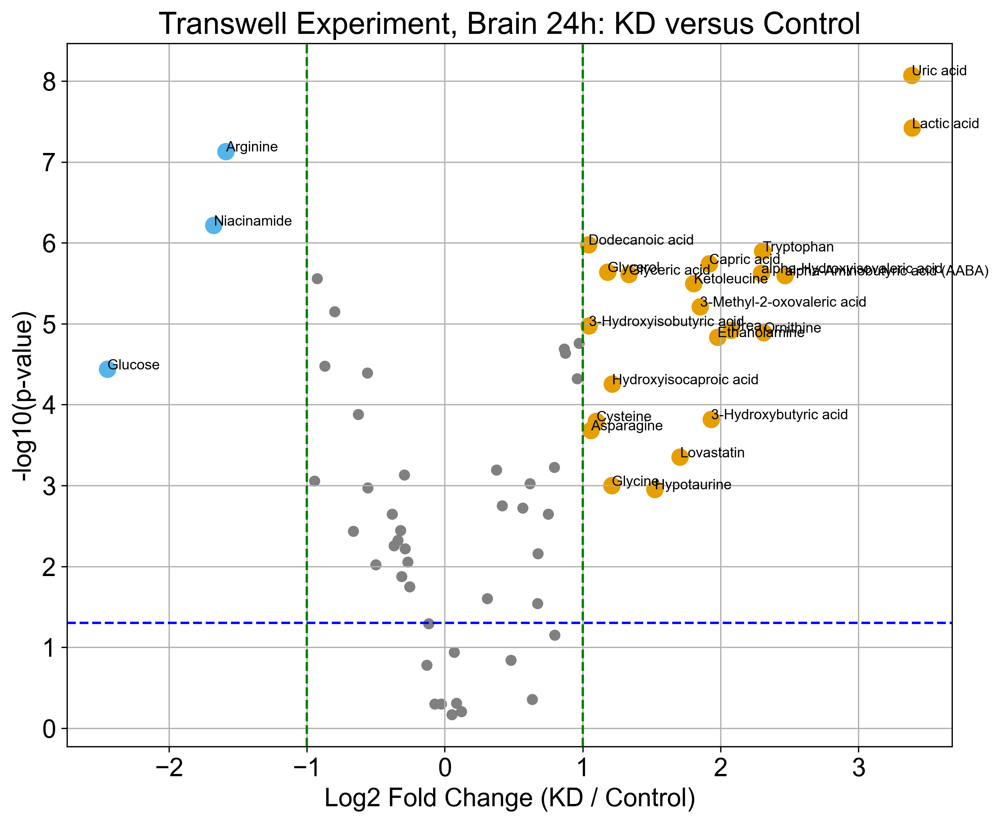

Significant up in KD:
                                                    Metabolite    log2FC  \
Lactic acid                                        Lactic acid  3.387587   
alpha-Aminobutyric acid (AABA)  alpha-Aminobutyric acid (AABA)  2.466172   
3-Hydroxybutyric acid                    3-Hydroxybutyric acid  1.930701   
3-Hydroxyisobutyric acid              3-Hydroxyisobutyric acid  1.045135   
alpha-Hydroxyisovaleric acid      alpha-Hydroxyisovaleric acid  2.296308   
3-Methyl-2-oxovaleric acid          3-Methyl-2-oxovaleric acid  1.851314   
Ketoleucine                                        Ketoleucine  1.803848   
Hydroxyisocaproic acid                  Hydroxyisocaproic acid  1.214114   
Urea                                                      Urea  2.075489   
Ethanolamine                                      Ethanolamine  1.978968   
Glycerol                                              Glycerol  1.179073   
Glycine                                                Glycine  1.

In [16]:
#Volcano plot TW Brain  24 h KD vs C; Normalize data to Brain 0h, ctrl to ctrl and KD to KD 2025-12-09
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('transwell_PCA_label1.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract samples
brain_kd_24h = data_numeric.filter(like='Brain_KD_24h', axis=0)
brain_c_24h = data_numeric.filter(like='Brain_C_24h', axis=0)
brain_kd_0h = data_numeric.filter(like='Brain_KD_0h', axis=0)
brain_c_0h = data_numeric.filter(like='Brain_C_0h', axis=0)

# Normalize each group to its 0h baseline
norm_kd = brain_kd_24h.div(brain_kd_0h.mean())
norm_ctrl = brain_c_24h.div(brain_c_0h.mean())

# Log + Pareto scaling
log_kd = np.log1p(norm_kd).div(np.sqrt(np.log1p(norm_kd).std()), axis=1)
log_ctrl = np.log1p(norm_ctrl).div(np.sqrt(np.log1p(norm_ctrl).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_kd.mean() / log_ctrl.mean())
p_vals = [ttest_ind(log_ctrl[col], log_kd[col]).pvalue for col in log_ctrl.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_ctrl.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_kd = hits[hits['log2FC'] > 1]
up_in_ctrl = hits[hits['log2FC'] < -1]

plt.scatter(up_in_kd['log2FC'], up_in_kd['-log10(p-value)'], color='#E69F00', s=100)  # orange
plt.scatter(up_in_ctrl['log2FC'], up_in_ctrl['-log10(p-value)'], color='#56B4E9', s=100)  # blue

# Annotate hits
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

# Title and axis labels
plt.title('Transwell Experiment, Brain 24h: KD versus Control')
plt.xlabel('Log2 Fold Change (KD / Control)')
plt.ylabel('-log10(p-value)')
plt.grid(True)

# Remove legend
plt.legend([], [], frameon=False)
plt.show()

# Print results
print("Significant up in KD:")
print(up_in_kd[['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in Control:")
print(up_in_ctrl[['Metabolite', 'log2FC', 'p-value']])


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


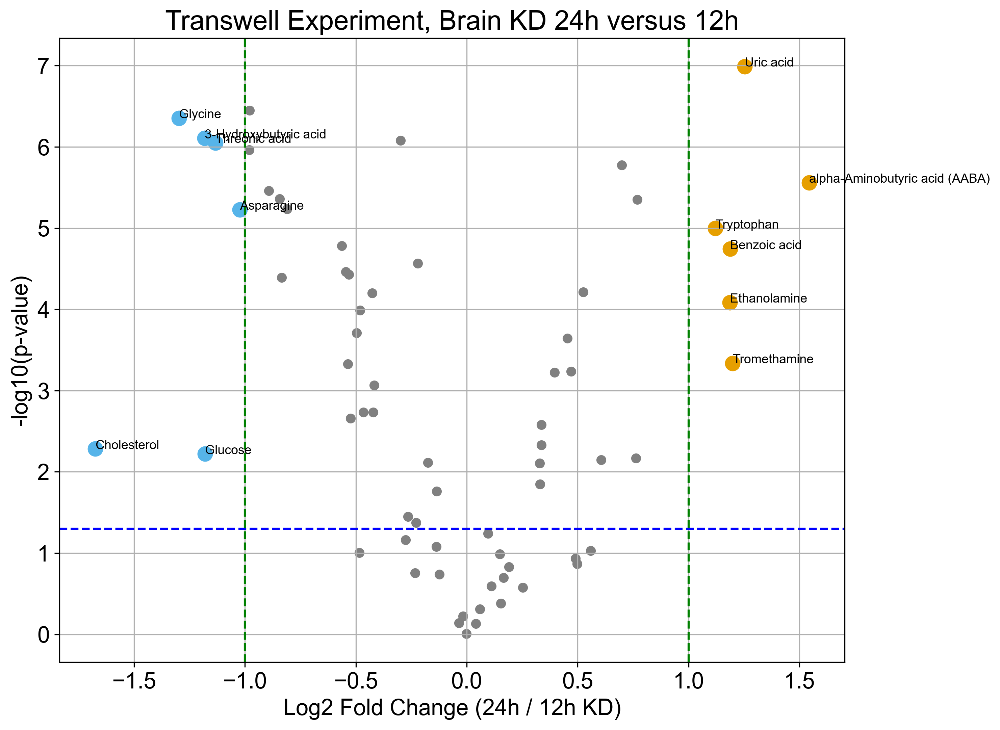

Significant up in 24h KD:
                                                    Metabolite    log2FC  \
alpha-Aminobutyric acid (AABA)  alpha-Aminobutyric acid (AABA)  1.543385   
Benzoic acid                                      Benzoic acid  1.187974   
Ethanolamine                                      Ethanolamine  1.186455   
Tromethamine                                      Tromethamine  1.197668   
Uric acid                                            Uric acid  1.252769   
Tryptophan                                          Tryptophan  1.121016   

                                     p-value  
alpha-Aminobutyric acid (AABA)  2.757047e-06  
Benzoic acid                    1.805486e-05  
Ethanolamine                    8.236484e-05  
Tromethamine                    4.601407e-04  
Uric acid                       1.022894e-07  
Tryptophan                      1.008187e-05  

Significant up in 12h KD:
                                  Metabolite    log2FC       p-value
3-Hydroxybutyric

In [17]:
# Volcano Plot: Transwell Brain KD, 24h vs 12h 2025-12-09
import pandas as pd
import numpy as np
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Global font and resolution settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('transwell_PCA_label1.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract samples
brain_kd_24h = data_numeric.filter(like='Brain_KD_24h', axis=0)
brain_kd_12h = data_numeric.filter(like='Brain_KD_12h', axis=0)
brain_kd_0h = data_numeric.filter(like='Brain_KD_0h', axis=0)

# Normalize to 0h baseline
norm_24 = brain_kd_24h.div(brain_kd_0h.mean())
norm_12 = brain_kd_12h.div(brain_kd_0h.mean())

# Log + Pareto scaling
log_24 = np.log1p(norm_24).div(np.sqrt(np.log1p(norm_24).std()), axis=1)
log_12 = np.log1p(norm_12).div(np.sqrt(np.log1p(norm_12).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_24.mean() / log_12.mean())
p_vals = [ttest_ind(log_12[col], log_24[col]).pvalue for col in log_12.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_12.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_24h = hits[hits['log2FC'] > 1]
up_in_12h = hits[hits['log2FC'] < -1]

plt.scatter(up_in_24h['log2FC'], up_in_24h['-log10(p-value)'], color='#E69F00', s=100)  # orange
plt.scatter(up_in_12h['log2FC'], up_in_12h['-log10(p-value)'], color='#56B4E9', s=100)  # blue

# Annotate hits
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

# Axis and title
plt.title('Transwell Experiment, Brain KD 24h versus 12h')
plt.xlabel('Log2 Fold Change (24h / 12h KD)')
plt.ylabel('-log10(p-value)')
plt.grid(True)

# Remove legend box if generated
plt.legend([],[], frameon=False)

plt.show()

# Print significant results
print("Significant up in 24h KD:")
print(up_in_24h[['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in 12h KD:")
print(up_in_12h[['Metabolite', 'log2FC', 'p-value']])


c:\Users\Omid\miniconda3\Lib\site-packages\pandas\core\nanops.py:1016: RuntimeWarning: invalid value encountered in subtract
  sqr = _ensure_numeric((avg - values) ** 2)


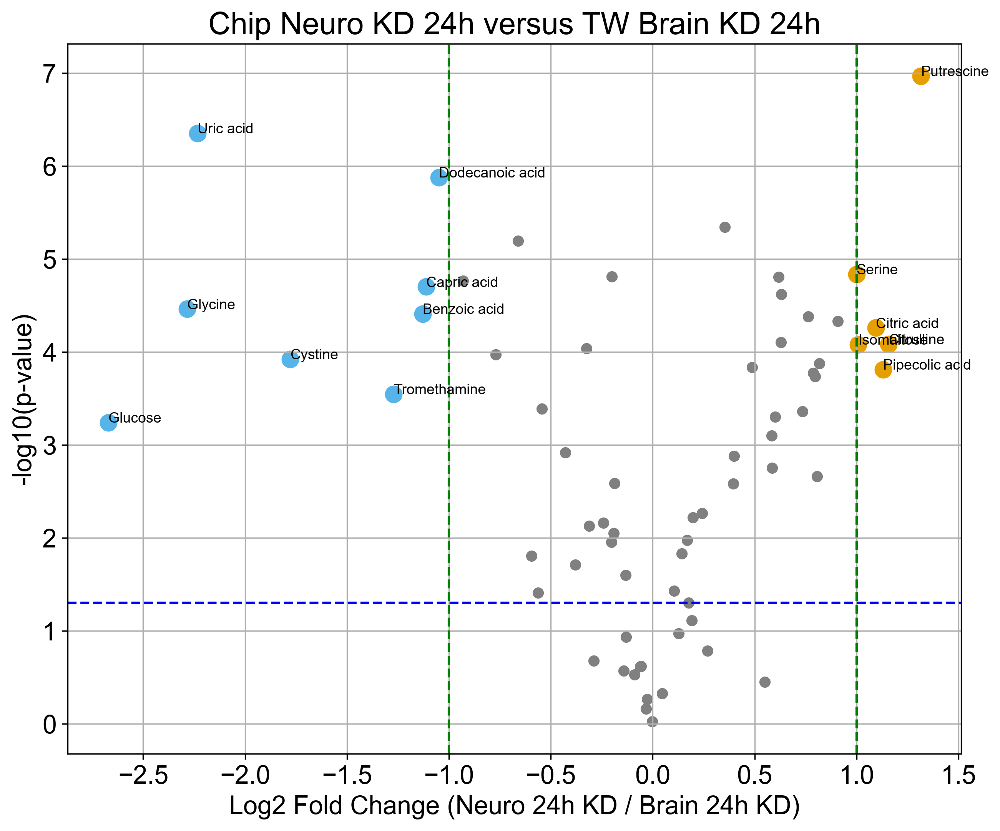

Significant up in Neuro KD:
                    Metabolite    log2FC       p-value
Serine                  Serine  1.000065  1.457314e-05
Pipecolic acid  Pipecolic acid  1.130071  1.549471e-04
Citrulline          Citrulline  1.157577  8.266329e-05
Putrescine          Putrescine  1.315045  1.073922e-07
Citric acid        Citric acid  1.095287  5.507279e-05
Isomaltose          Isomaltose  1.009007  8.350228e-05

Significant up in Brain KD:
                      Metabolite    log2FC       p-value
Benzoic acid        Benzoic acid -1.127729  3.886509e-05
Glycine                  Glycine -2.283190  3.455791e-05
Tromethamine        Tromethamine -1.271711  2.837856e-04
Capric acid          Capric acid -1.112039  1.990207e-05
Dodecanoic acid  Dodecanoic acid -1.048711  1.324986e-06
Glucose                  Glucose -2.670320  5.735173e-04
Uric acid              Uric acid -2.232303  4.448052e-07
Cystine                  Cystine -1.778230  1.193844e-04


In [ ]:
#Volcano plot: Brain 24h KD TW vs Neuro KD 24h chip, normalized to Brain 0h KD and Astro KD 0h, respectively 2025-12-09
import pandas as pd
import numpy as np  
from scipy.stats import ttest_ind
import matplotlib.pyplot as plt

# Font and figure settings
plt.rc('font', size=16, family='Arial')
plt.rcParams['figure.dpi'] = 300

# Load data
data = pd.read_csv('chip_TW_20251209_removing_only_2outliers.csv')
data.set_index('Sample', inplace=True)
data_numeric = data.drop(columns=['Label'])

# Extract TW Brain KD samples
brain_kd_24h = data_numeric.filter(like='Brain_KD_24h', axis=0)
brain_kd_0h = data_numeric.filter(like='Brain_KD_0h', axis=0)

# Extract Chip Neuro KD samples
neuro_kd_24h = data_numeric.filter(like='Neuro_KD_24h', axis=0)
astro_kd_0h = data_numeric.filter(like='Astro_KD_0h', axis=0)

# Normalize each to its own 0h baseline
norm_brain = brain_kd_24h.div(brain_kd_0h.mean())
norm_neuro = neuro_kd_24h.div(astro_kd_0h.mean())

# Log + Pareto scaling
log_brain = np.log1p(norm_brain).div(np.sqrt(np.log1p(norm_brain).std()), axis=1)
log_neuro = np.log1p(norm_neuro).div(np.sqrt(np.log1p(norm_neuro).std()), axis=1)

# Fold change and t-tests
log2_fc = np.log2(log_neuro.mean() / log_brain.mean())
p_vals = [ttest_ind(log_brain[col], log_neuro[col]).pvalue for col in log_brain.columns]

# Compile results
volcano_df = pd.DataFrame({
    'Metabolite': log_brain.columns,
    'log2FC': log2_fc,
    'p-value': p_vals
})
volcano_df['-log10(p-value)'] = -np.log10(volcano_df['p-value'])

# Volcano plot
plt.figure(figsize=(10, 8))
plt.scatter(volcano_df['log2FC'], volcano_df['-log10(p-value)'], color='gray')

# Highlight significant hits
# Highlight significant hits with colorblind-safe palette
hits = volcano_df[(volcano_df['p-value'] < 0.05) & (abs(volcano_df['log2FC']) > 1)]
up_in_kd = hits[hits['log2FC'] > 1]
up_in_ctrl = hits[hits['log2FC'] < -1]

plt.scatter(up_in_kd['log2FC'], up_in_kd['-log10(p-value)'], color='#E69F00', s=100, label='Up in KD')  # orange
plt.scatter(up_in_ctrl['log2FC'], up_in_ctrl['-log10(p-value)'], color='#56B4E9', s=100, label='Up in Control')  # blue

# Annotate
for _, row in hits.iterrows():
    plt.text(row['log2FC'], row['-log10(p-value)'], row['Metabolite'], fontsize=9)

# Threshold lines
plt.axhline(-np.log10(0.05), color='blue', linestyle='--')
plt.axvline(1, color='green', linestyle='--')
plt.axvline(-1, color='green', linestyle='--')

plt.title('Chip Neuro KD 24h versus TW Brain KD 24h')
plt.xlabel('Log2 Fold Change (Neuro 24h KD / Brain 24h KD)')
plt.ylabel('-log10(p-value)')
plt.grid(True)
plt.show()

# Print and save significant hits
print("Significant up in Neuro KD:")
print(hits[hits['log2FC'] > 1][['Metabolite', 'log2FC', 'p-value']])

print("\nSignificant up in Brain KD:")
print(hits[hits['log2FC'] < -1][['Metabolite', 'log2FC', 'p-value']])

# Save files
#hits.to_csv('sig_hits_NeuroKD_vs_BrainKD_24h_20251209.csv', index=False)


Wrote detailed intersection lists to venn_intersections\intersection_lists.csv


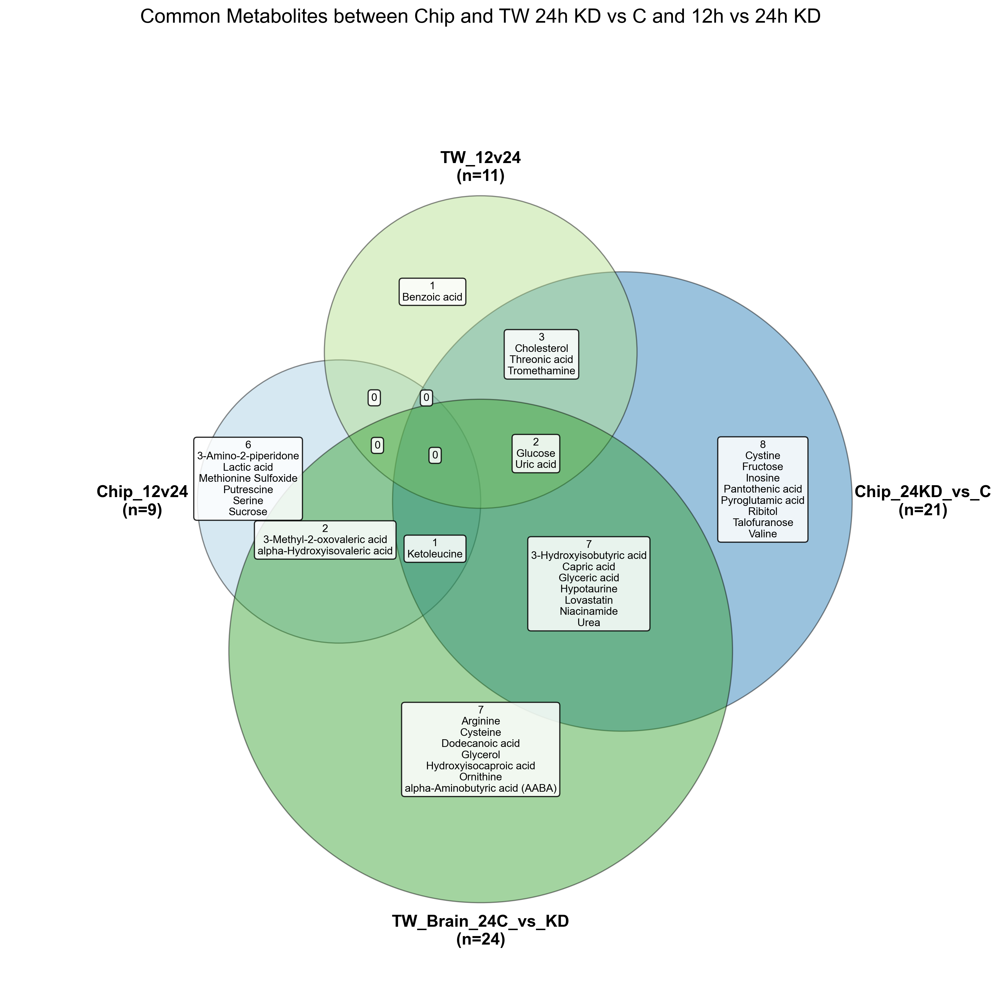

In [39]:
#Venn diagram and intersection lists from significant hits between chip and TW 24h KD vsC and 12h vs 24h KD 2025-12-11

import pandas as pd
import matplotlib.pyplot as plt
from shapely.geometry import Point
from shapely.ops import unary_union
import os

# -------- settings --------
plt.rc('font', size=14, family='Arial')
plt.rcParams['figure.dpi'] = 300

name_limit = 20               # max names to show per region (None to show all)
show_only_common = False     # False -> annotate all non-empty regions
min_rad = 0.9                # radius for the smallest set
max_rad = 1.6                # radius for the largest set
circle_resolution = 256      # shapely buffer resolution

# -------- file paths (adjust if needed) --------
p1 = "./metabulome_output_20251209/sig_hits/sig_hits_chip_Neuro12KDvs24KD_20251209.csv"
p2 = "./metabulome_output_20251209/sig_hits/sig_hits_chip_NeuroKDvsCtrl24h_20251209.csv"
p3 = "./metabulome_output_20251209/sig_hits/sig_hits_TW_12KDvs24KD_20251209.csv"
p4 = "./metabulome_output_20251209/sig_hits/sig_hits_TW_Brain24CtoKD_20251209.csv"

def read_firstcol_skip_header(path):
    df = pd.read_csv(path, dtype=str, header=0)
    col = df.iloc[:, 0].astype(str).str.strip().dropna().reset_index(drop=True)
    return set(col.iloc[1:]) if len(col) > 1 else set()

A = read_firstcol_skip_header(p1)
B = read_firstcol_skip_header(p2)
C = read_firstcol_skip_header(p3)
D = read_firstcol_skip_header(p4)

labels = ["Chip_12v24", "Chip_24KD_vs_C", "TW_12v24", "TW_Brain_24C_vs_KD"]
sets = [A, B, C, D]
contents = dict(zip(labels, sets))

# -------- compute exclusive intersections (and save CSV) --------
outdir = "venn_intersections"
os.makedirs(outdir, exist_ok=True)
names = labels
all_sets = sets

rows = []
intersection_dict = {}
counts_map = {}

for r in range(1, 1 << len(names)):
    mask = [(r >> i) & 1 for i in range(len(names))]
    included = [names[i] for i, m in enumerate(mask) if m]
    included_sets = [all_sets[i] for i, m in enumerate(mask) if m]
    excluded_sets = [all_sets[i] for i, m in enumerate(mask) if not m]
    inter = set.intersection(*included_sets) if included_sets else set()
    if excluded_sets:
        inter = inter - set.union(*excluded_sets)
    combo = ";".join(included)
    cnt = len(inter)
    rows.append({"combo": combo, "count": cnt, "members": "|".join(sorted(inter))})
    counts_map[combo] = cnt
    if inter:
        intersection_dict[combo] = sorted(inter)

pd.DataFrame(rows).sort_values(["count", "combo"], ascending=[False, True]).to_csv(
    os.path.join(outdir, "intersection_lists.csv"), index=False
)
print("Wrote detailed intersection lists to", os.path.join(outdir, "intersection_lists.csv"))

# -------- compute radii proportional to set sizes --------
sizes = [len(s) for s in sets]
min_size = min(sizes) if sizes else 0
max_size = max(sizes) if sizes else 1
rad_by_set = []
for s in sizes:
    if max_size == min_size:
        r = (min_rad + max_rad) / 2.0
    else:
        r = min_rad + (s - min_size) * (max_rad - min_rad) / (max_size - min_size)
    rad_by_set.append(max(0.4, r))

# -------- geometry: circle centers and shapely circles --------
centers = [(-0.9, 0.0), (0.9, 0.0), (0.0, 0.95), (0.0, -0.95)]
circle_polys = [Point(x, y).buffer(rad_by_set[i], resolution=circle_resolution) for i, (x, y) in enumerate(centers)]

def region_polygon(mask_bits):
    included_idx = [i for i, m in enumerate(mask_bits) if m]
    excluded_idx = [i for i, m in enumerate(mask_bits) if not m]
    if not included_idx:
        return None
    poly_in = circle_polys[included_idx[0]]
    for i in included_idx[1:]:
        poly_in = poly_in.intersection(circle_polys[i])
    if not poly_in or poly_in.is_empty:
        return None
    if excluded_idx:
        poly_ex = unary_union([circle_polys[i] for i in excluded_idx])
        poly_out = poly_in.difference(poly_ex)
    else:
        poly_out = poly_in
    if poly_out.is_empty:
        return None
    return poly_out

# -------- plotting base circles --------
fig, ax = plt.subplots(figsize=(12, 12))
colors = ["#a6cee3", "#1f78b4", "#b2df8a", "#33a02c"]

for i, ((x, y), r, c) in enumerate(zip(centers, rad_by_set, colors)):
    circ = plt.Circle((x, y), r, edgecolor='k', linewidth=1, facecolor=c, alpha=0.45)
    ax.add_patch(circ)

# draw set labels outside circles, with n=...
label_offsets = [
    (centers[0][0] - rad_by_set[0] - 0.35, centers[0][1]),
    (centers[1][0] + rad_by_set[1] + 0.45, centers[1][1]),
    (centers[2][0], centers[2][1] + rad_by_set[2] + 0.18),
    (centers[3][0], centers[3][1] - rad_by_set[3] - 0.18),
]
for i, ((lx, ly), lab) in enumerate(zip(label_offsets, labels)):
    ax.text(lx, ly, f"{lab}\n(n={len(sets[i])})", ha='center', va='center', fontsize=14, fontweight='bold')

# -------- annotate regions with counts + names --------
def compact(items, limit):
    if limit is None:
        return list(items)
    items = list(items)
    if len(items) > limit:
        return items[:limit] + [f"...(+{len(items)-limit})"]
    return items

for r in range(1, 1 << len(names)):
    mask_bits = tuple(((r >> i) & 1) for i in range(len(names)))
    combo = ";".join([names[i] for i, m in enumerate(mask_bits) if m])
    if show_only_common and combo.count(";") < 1:
        continue
    poly = region_polygon(mask_bits)
    if poly is None:
        continue
    try:
        p = poly.representative_point()
        x, y = p.x, p.y
    except Exception:
        c = poly.centroid
        x, y = c.x, c.y
    cnt = counts_map.get(combo, 0)
    members = intersection_dict.get(combo, [])
    shown = compact(members, name_limit)
    if shown:
        text = f"{cnt}\n" + "\n".join(shown)
    else:
        text = f"{cnt}"
    ax.text(x, y, text, fontsize=9, ha='center', va='center',
            bbox=dict(facecolor='white', alpha=0.85, boxstyle='round,pad=0.3'),
            wrap=True)

ax.set_xlim(-3.0, 3.0)
ax.set_ylim(-3.0, 3.0)
ax.set_aspect('equal')
ax.axis('off')
plt.title("Common Metabolites between Chip and TW 24h KD vs C and 12h vs 24h KD")
plt.tight_layout()
plt.show()